# New York City Airbnb

# Table of Contents

- [1-Introduction](#scrollTo=TtiGDdMAd6lC)
- [2-Problem Statement](#scrollTo=z2ZbR9-DeHBx)
- [3- About the Dataset](#scrollTo=ovr-FWuUeYs1)
- [4-Data cleaning phase](#scrollTo=391f9c43-dbe3-417a-9b4c-9a4138573e9c)
- [5-EDA](#scrollTo=etP52SAXelQ-)
- [6-Data Visualizations & Maps](#scrollTo=cF1un-NTqHmw)
- [7-Outliers analysis](#scrollTo=9fe2dbfe-9e3f-43db-8de3-f8cf0b934355)
- [8-Model](#scrollTo=hzJIzvOJqH7L)
- [9- insight](#scrollTo=uYR2ZkExIH-k)

## 1-Introduction <a name="introduction"></a>  
Airbnb has transformed the way people travel, offering a wide range of accommodation options beyond traditional hotels.  
New York City, being one of the most visited cities in the world, has a highly competitive and diverse Airbnb market.  

The goal of this report is to perform **Exploratory Data Analysis (EDA)** and build model to better understand the distribution of listings, pricing dynamics, availability, and demand patterns across NYC.  
This will help uncover market trends and provide actionable insights for hosts, travelers, and policymakers.  


## 2-Problem Statement <a name="problem-statement"></a>  
With thousands of Airbnb listings across New York City, pricing and availability vary drastically depending on factors like **location, room type, host behavior, and demand**.  

Key challenges include:  
- Identifying what drives Airbnb prices in different neighborhoods.  
- Detecting outliers and anomalies .  
- Understanding spatial distribution of listings and demand.  
- Exploring host patterns .  

The problem we aim to solve:  
**What factors influence Airbnb pricing and demand in NYC, and what insights can we extract to guide hosts, customers, and stakeholders?**  

## 3- About the Dataset <a name="about-the-dataset"></a>  
The dataset comes from **Inside Airbnb** and contains detailed information on NYC listings.  

**Dataset Snapshot:**  
- **Rows:** 49,000 listings  
- **Columns:** 16 attributes  

**Features:**  
- `id`, `name` → Listing identification & description  
- `host_id`, `host_name` → Host details  
- `neighbourhood_group`, `neighbourhood` → Location (borough & neighborhood)  
- `latitude`, `longitude` → Geospatial coordinates  
- `room_type` → Entire home, Private room, Shared room, etc.  
- `price` → Price per night in USD  
- `minimum_nights` → Minimum stay requirement  
- `number_of_reviews`, `last_review` → Customer engagement metrics  
- `reviews_per_month` → Average review frequency  
- `calculated_host_listings_count` → Number of listings per host  
- `availability_365` → Availability throughout the year  

This dataset provides a rich foundation for **price analysis, geospatial visualization, host profiling, and demand estimation**.  

# 4-Data cleaning phase

In [24]:
#Import all relevant libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import RobustScaler
from sklearn.impute import KNNImputer
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor, plot_importance
from sklearn import metrics
import joblib
%matplotlib inline

In [39]:
df = pd.read_csv('AB_NYC_2019.csv')

df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [20]:
df.isnull().sum()

,0
id,0
name,16
host_id,0
host_name,21
neighbourhood_group,0
neighbourhood,0
latitude,0
longitude,0
room_type,0
price,0


In [ ]:
missing = df.isna().sum().sort_values(ascending=False)
miss_df = missing.reset_index()
miss_df.columns = ["column","missing_count"]
miss_df["missing_pct"] = (miss_df["missing_count"]/len(df))*100

fig = px.bar(miss_df, x="column", y="missing_count",
             title="Missing Values per Column", text_auto=True)
fig.update_layout(xaxis_tickangle=-45)
fig.show()

In [ ]:
#1.1 name cleaning

df["name"].isnull().sum()

np.int64(16)

In [ ]:
#1.2 Replace missing names with "Unknown"
df["name"] = df["name"].fillna("Unknown")

In [ ]:
#1.3name check

df["name"].isnull().sum()

np.int64(0)

In [ ]:
#2.1 host_name cleaning
df["host_name"].isnull().sum()

np.int64(21)

In [ ]:
#2.2 Fill missing host_name with "Unknown"
df["host_name"] = df["host_name"].fillna("Unknown Host")

In [ ]:
#2.3 host_name cleaning
df["host_name"].isnull().sum()

np.int64(0)

In [ ]:
#3.1 reviews_per_month cleaning
df["reviews_per_month"].isnull().sum()

np.int64(10052)

In [ ]:
#3.2 Fill NaN with 0
df["reviews_per_month"] = df["reviews_per_month"].fillna(0)

In [ ]:
#3.3 reviews_per_month cleaning
df["reviews_per_month"].isnull().sum()

np.int64(0)

In [ ]:
#4.1 reviews_per_month cleaning
df["last_review"].isnull().sum()

np.int64(10052)

In [ ]:
#4.2 Backward Fill
df["last_review"] = df["last_review"].bfill()

In [ ]:
# Replace NaN in last_review with the most frequent date (mode)
df["last_review"] = df["last_review"].fillna(df["last_review"].mode()[0])

In [ ]:
#4.3 reviews_per_month cleaning
df["last_review"].isnull().sum()

np.int64(0)

In [48]:
# Count non-missing reviews_per_month for each neighbourhood_group and sort in descending order
reviews_count = df.groupby("neighbourhood_group").agg({"reviews_per_month": ["count"]}).sort_values(by=("reviews_per_month", "count"), ascending=False).reset_index()
reviews_count


,neighbourhood_group,reviews_per_month
,,count
0,Manhattan,16632
1,Brooklyn,16447
2,Queens,4574
3,Bronx,876
4,Staten Island,314


In [49]:
# Flatten the multi-level columns
reviews_count.columns = ['neighbourhood_group', 'reviews_count']

# Create a bar chart with color
fig = px.bar(reviews_count, x="neighbourhood_group", y="reviews_count",
             title="Number of Listings with Reviews per Neighbourhood Group",
             labels={"neighbourhood_group": "Neighbourhood Group", "reviews_count": "Number of Listings with Reviews"},
             color="neighbourhood_group")
fig.show()

# 5-EDA

In [37]:
#!pip uninstall pandas-profiling -y
!pip install ydata-profiling

In [6]:
from ydata_profiling import ProfileReport
df_profile = ProfileReport(df, title='AB_NYC_2019')
df_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 16/16 [00:02<00:00,  7.21it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
#check duplicated
df.duplicated().sum()

np.int64(0)

In [8]:
#rows and column counts
df.shape

(48895, 16)

In [9]:
#data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [10]:
def check_df(dataframe, head=5):
    print('________________ Shape ________________')
    print(dataframe.shape)
    print('________________ Types ________________')
    print(dataframe.dtypes)
    print('________________ null ________________')
    print(dataframe.isnull().sum())

check_df(df)

________________ Shape ________________
(48895, 16)
________________ Types ________________
id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object
________________ null ________________
id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group    

In [11]:
# Summary statistics
df.describe().round(2)

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.00,4.889500e+04,48895.00,48895.00,48895.00,48895.00,48895.00,38843.00,48895.00,48895.00
mean,19017143.24,6.762001e+07,40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,10983108.39,7.861097e+07,0.05,0.05,240.15,20.51,44.55,1.68,32.95,131.62
min,2539.00,2.438000e+03,40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,9471945.00,7.822033e+06,40.69,-73.98,69.00,1.00,1.00,0.19,1.00,0.00
50%,19677284.00,3.079382e+07,40.72,-73.96,106.00,3.00,5.00,0.72,1.00,45.00
75%,29152178.50,1.074344e+08,40.76,-73.94,175.00,5.00,24.00,2.02,2.00,227.00
max,36487245.00,2.743213e+08,40.91,-73.71,10000.00,1250.00,629.00,58.50,327.00,365.00


In [12]:
#lets check what are the unique values of both columns

df.neighbourhood_group.unique().tolist()

['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx']

In [13]:
df.room_type.unique().tolist()

['Private room', 'Entire home/apt', 'Shared room']

In [14]:
#Top 15 hosts with the most properties

df.host_id.value_counts().head(15)

,count
host_id,
219517861,327
107434423,232
30283594,121
137358866,103
16098958,96
12243051,96
61391963,91
22541573,87
200380610,65


In [16]:
# Count zero prices by neighbourhood and room_type
zeros_by_neigh_room = (
    df.query("price == 0")[["neighbourhood_group", "room_type"]]
    .value_counts()
    .reset_index(name="count")
)

print(zeros_by_neigh_room.head(20))

  neighbourhood_group        room_type  count
0            Brooklyn     Private room      6
1            Brooklyn      Shared room      2
2               Bronx     Private room      1
3            Brooklyn  Entire home/apt      1
4           Manhattan  Entire home/apt      1


In [17]:
df['price'] = df.groupby('neighbourhood')['price'].transform(
    lambda x: x.mask(x == 0, x[x > 0].median())
)


In [18]:
# Count non-missing reviews_per_month for each neighbourhood_group
df.groupby("neighbourhood_group").agg({"host_id":["count"]})

,host_id
,count
neighbourhood_group,
Bronx,1091
Brooklyn,20104
Manhattan,21661
Queens,5666
Staten Island,373


# 6-Data Visualizations & Maps

In [24]:
import plotly.express as px

# Count the occurrences of each room type
room_counts = df['room_type'].value_counts().reset_index()
room_counts.columns = ['room_type', 'count']

# Create a bar chart
fig1 = px.bar(room_counts,
              x='room_type', y='count',
              labels={'room_type': 'Room Type', 'count': 'Count'},
              title='Room Type Distribution',
              color='room_type')
fig1.show()

In [22]:
neigh_group = df['neighbourhood_group'].value_counts().reset_index()
neigh_group.columns = ['neighbourhood_group', 'count']

fig = px.pie(neigh_group, values='count', names='neighbourhood_group',
             title='Distribution of Listings by Neighbourhood Group')
fig.show()


In [26]:
top10_neigh_price = df.groupby('neighbourhood')['price'].mean().sort_values(ascending=False).head(10).reset_index()

fig = px.bar(top10_neigh_price, x='price', y='neighbourhood',
             orientation='h',
             title='Top 10 Expensive Neighbourhoods',
             labels={'price': 'Average Price ($)', 'neighbourhood': 'Neighbourhood'},
             color="neighbourhood"
             )
fig.show()

In [30]:
fig = px.scatter(df, x='number_of_reviews', y='price',
                 title='Number of Reviews vs Price',
                 labels={'number_of_reviews': 'Number of Reviews', 'price': 'Price'},
                 opacity=0.5,
                 color='room_type')
fig.show()

In [32]:
top_reviews_neigh = df.groupby('neighbourhood')['number_of_reviews'].sum().sort_values(ascending=False).head(10).reset_index()

fig = px.bar(top_reviews_neigh, x='neighbourhood', y='number_of_reviews',
             title='Top 10 Neighbourhoods by Total Reviews',
             labels={'number_of_reviews': 'Total Reviews'},
             color="neighbourhood"
)
fig.show()

In [33]:
pv = (df.query("price > 0")
        .groupby(["neighbourhood_group","room_type"])["price"].median()
        .unstack().round(1).fillna(0))
px.imshow(pv, text_auto=True, aspect="auto",
          title="Avg Price Heatmap (Group × Room Type)").show()

In [34]:
#  map (if lat/lon exist)
if {"latitude","longitude"}.issubset(df.columns):
    smp = df.dropna(subset=["latitude","longitude"]).query("price > 0") \
            .sample(min(3000, len(df)), random_state=42)
    px.scatter_mapbox(smp, lat="latitude", lon="longitude",
                      color="room_type", size="price", size_max=12,
                      mapbox_style="open-street-map", zoom=9, height=520,
                      title="Listings Map ").show()

In [40]:
# Heat Map of Geographic Distribution of Locations
m=folium.Map([40.7128,-74.0060],zoom_start=11)

HeatMap(df[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)

display(m)

In [43]:
import folium
from folium.plugins import MarkerCluster

# Create a base map
m = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Create a MarkerCluster layer
marker_cluster = MarkerCluster().add_to(m)

# Add markers for each listing
for idx, row in df.dropna(subset=["latitude", "longitude", "price"]).query("price > 0").sample(min(3000, len(df)), random_state=42).iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=f"Price: ${row['price']}<br>Room Type: {row['room_type']}<br>Neighbourhood: {row['neighbourhood']}"
    ).add_to(marker_cluster)

# Display the map
display(m)

In [44]:
top_nb = df.groupby("neighbourhood_group")["price"].mean().sort_values(ascending=False).head().reset_index()
px.bar(top_nb, x="neighbourhood_group", y="price", title="Top 5 Neighbourhoods by mean Price", color="neighbourhood_group").show()  # premium areas

# 7-Outliers analysis

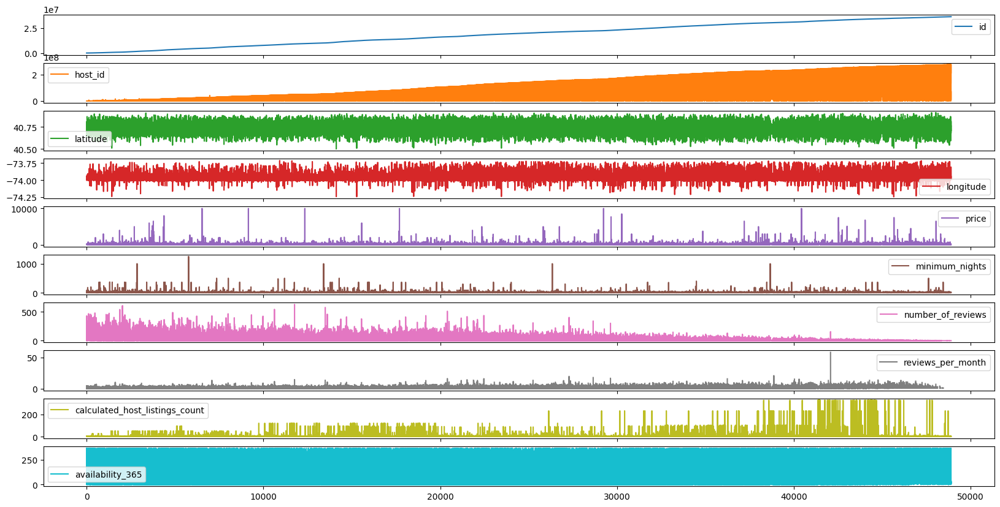

In [51]:
# Plot numeric columns only
df.plot(subplots=True, figsize=(20, 10))
plt.show()

In [52]:
# 1) Calculate Q1, Q3, and IQR
Q1 = df["price"].quantile(0.25)   # First quartile (25%)
Q3 = df["price"].quantile(0.75)   # Third quartile (75%)
IQR = Q3 - Q1                     # Interquartile Range

# 2) Calculate lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# 3) Detect outliers
outliers = df[(df["price"] < lower_bound) | (df["price"] > upper_bound)]

# 4) Create a filtered DataFrame without outliers
df_filtered = df[(df["price"] >= lower_bound) & (df["price"] <= upper_bound)]

# 5) Print results
print("Q1:", Q1)
print("Q3:", Q3)
print("IQR:", IQR)
print("Lower Bound:", lower_bound)
print("Upper Bound:", upper_bound)
print("\nNumber of outliers:", len(outliers))
print("Number of rows after filtering:", df_filtered.shape[0])

Q1: 69.0
Q3: 175.0
IQR: 106.0
Lower Bound: -90.0
Upper Bound: 334.0

Number of outliers: 2972
Number of rows after filtering: 45923


In [53]:
px.histogram(df, x="price", nbins=60, title="Price — Histogram").show()

In [54]:
px.box(df, y="price", points="outliers", log_y=True,
       title="Price — Box Plot (log scale)").show()

In [55]:
df.describe().round(2)

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,48895.00,4.889500e+04,48895.00,48895.00,48895.00,48895.00,48895.00,38843.00,48895.00,48895.00
mean,19017143.24,6.762001e+07,40.73,-73.95,152.72,7.03,23.27,1.37,7.14,112.78
std,10983108.39,7.861097e+07,0.05,0.05,240.15,20.51,44.55,1.68,32.95,131.62
min,2539.00,2.438000e+03,40.50,-74.24,0.00,1.00,0.00,0.01,1.00,0.00
25%,9471945.00,7.822033e+06,40.69,-73.98,69.00,1.00,1.00,0.19,1.00,0.00
50%,19677284.00,3.079382e+07,40.72,-73.96,106.00,3.00,5.00,0.72,1.00,45.00
75%,29152178.50,1.074344e+08,40.76,-73.94,175.00,5.00,24.00,2.02,2.00,227.00
max,36487245.00,2.743213e+08,40.91,-73.71,10000.00,1250.00,629.00,58.50,327.00,365.00


# 8-Model

In [1]:
#  Load Dataset for model
df_models = pd.read_csv("AB_NYC_2019.csv")



In [2]:
# here we will drop columns that are not useful for prediction
drop_list = ['id', 'host_id', 'host_name', "last_review"]
df_models.drop(drop_list, axis=1, inplace=True)


In [3]:
df_show = df_models[["reviews_per_month"]]
df_show.head()

,reviews_per_month
0,0.21
1,0.38
2,NaN
3,4.64
4,0.10


In [4]:

# here we will use RobustScaler is good for outlier and skewed data
rs = RobustScaler()

df_show = pd.DataFrame(rs.fit_transform(df_show), columns=df_show.columns)

df_show.head()


,reviews_per_month
0,-0.278689
1,-0.185792
2,NaN
3,2.142077
4,-0.338798


In [5]:

# Apply KNN imputer to fill missing values
df_show = pd.DataFrame(
    KNNImputer(n_neighbors=5).fit_transform(df_show),
    columns=df_show.columns
)

df_show.head()


,reviews_per_month
0,-0.278689
1,-0.185792
2,0.356952
3,2.142077
4,-0.338798


In [6]:
# Inverse transform
df_show = pd.DataFrame(rs.inverse_transform(df_show), columns=df_show.columns)

df_models[["reviews_per_month"]] = df_show
df_models.head()

,name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.210000,6,365
1,Skylit Midtown Castle,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.380000,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1.373221,1,365
3,Cozy Entire Floor of Brownstone,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.640000,1,194
4,Entire Apt: Spacious Studio/Loft by central park,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.100000,1,0


In [7]:

# Calculate the correlation matrix using the processed DataFrame
correlation_matrix = df_models.corr(numeric_only=True).round(3) # Round to 3 decimal places

# Draw the heatmap using Plotly
fig = px.imshow(correlation_matrix,
                text_auto=True,
                aspect="auto",
                title="Correlation Matrix of Numerical Variables")

fig.update_traces(textfont_size=10) # Increase font size of annotations

fig.show()

In [8]:
# Display the correlation matrix as a table
display(correlation_matrix)

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
latitude,1.000,0.085,0.034,0.025,-0.015,-0.009,0.020,-0.011
longitude,0.085,1.000,-0.150,-0.063,0.059,0.132,-0.115,0.083
price,0.034,-0.150,1.000,0.043,-0.048,-0.022,0.057,0.082
minimum_nights,0.025,-0.063,0.043,1.000,-0.080,-0.092,0.128,0.144
number_of_reviews,-0.015,0.059,-0.048,-0.080,1.000,0.530,-0.072,0.172
reviews_per_month,-0.009,0.132,-0.022,-0.092,0.530,1.000,-0.007,0.163
calculated_host_listings_count,0.020,-0.115,0.057,0.128,-0.072,-0.007,1.000,0.226
availability_365,-0.011,0.083,0.082,0.144,0.172,0.163,0.226,1.000


In [9]:
col = "price"

# Calculate quantiles
q1 = df_models[col].quantile(0.05)
q3 = df_models[col].quantile(0.95)

# Interquartile range
iqr = q3 - q1

# Calculate limits
low_limit = q1 - 1.5 * iqr
up_limit = q3 + 1.5 * iqr

print("Lower limit:", low_limit)
print("Upper limit:", up_limit)


Lower limit: -432.5
Upper limit: 827.5


In [10]:
# Count outliers below/above thresholds
outliers_below = (df_models[col] < low_limit).sum()
outliers_above = (df_models[col] > up_limit).sum()

print(f"Outliers below: {outliers_below}")
print(f"Outliers above: {outliers_above}")


Outliers below: 0
Outliers above: 414


In [11]:
# Cap outliers
df_models.loc[df_models[col] < low_limit, col] = low_limit
df_models.loc[df_models[col] > up_limit, col] = up_limit


/tmp/ipython-input-2883281381.py:2: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-432.5' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.



In [12]:
# Verify no more extreme values
print("Min:", df_models[col].min())
print("Max:", df_models[col].max())


Min: 0.0
Max: 827.5


In [13]:
# Get the smallest non-zero price
min_positive_price = df_models.loc[df_models["price"] > 0, "price"].min()
print("Minimum positive price:", min_positive_price)


Minimum positive price: 10.0


In [14]:
# Replace 0 values with minimum positive price
df_models.loc[df_models["price"] == 0, "price"] = min_positive_price


In [15]:
print("Min:", df_models["price"].min())
print("Max:", df_models["price"].max())


Min: 10.0
Max: 827.5


In [16]:
# This feature represents the total cost of the house for the minimum number of nights. It takes the total of the price for minimum nights.
df_models['NEW_total_cost'] = df_models['price'] * df_models['minimum_nights']

# This feature can be used to estimate for how long a house has been listed. This duration is calculated by dividing the total number of reviews that the house has received by the number of reviews per month.
df_models['NEW_estimated_listed_months'] = df_models['number_of_reviews'] / df_models['reviews_per_month']

# This feature gives the ratio of how long a house is available throughout the year.
df_models['NEW_availability_ratio'] = df_models['availability_365'] / 365

# This feature gives the daily average reviews a host receives. It divides the reviews per month by the number of days in a month.
df_models['NEW_daily_average_reviews'] = df_models['reviews_per_month'] / 30

# This feature estimates how much a host can earn in a year. It multiplies the price of a house with how many days it is available in a year.
df_models['NEW_annual_income'] = df_models['price'] * df_models['availability_365']

# This feature gives the occupancy rate of a house throughout the year. It subtracts from 365 the number of days a house is available in a year.
df_models['NEW_house_occupancy_rate'] = 365 - df_models['availability_365']


In [17]:


# Select only the new features
new_features_df = df_models[['NEW_total_cost', 'NEW_estimated_listed_months',
                             'NEW_availability_ratio', 'NEW_daily_average_reviews',
                             'NEW_annual_income',
                             'NEW_house_occupancy_rate',"price"]]

# Calculate the correlation matrix for the new features and round to 3 decimal places
correlation_matrix_new_features = new_features_df.corr().round(3)

# Draw the heatmap using Plotly
fig = px.imshow(correlation_matrix_new_features,
                text_auto=True,
                aspect="auto",
                title="Correlation Matrix of New Features")

fig.update_traces(textfont_size=10) # Increase font size of annotations

fig.show()

In [18]:
# One-hot encoding function for categorical columns
def one_hot_encoder(dataframe, categorical_cols, drop_first=False):
    dataframe = pd.get_dummies(dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

# Get categorical columns
cat_cols = df_models.select_dtypes(include=['object']).columns.tolist()


# Apply one-hot encoding
df_models = one_hot_encoder(df_models, cat_cols, drop_first=True)

# Get numerical columns after encoding, excluding target
num_cols = df_models.select_dtypes(include=np.number).columns.tolist()
if 'price' in num_cols:
    num_cols.remove('price')

# Scale numerical features
scaler = RobustScaler()
df_models[num_cols] = scaler.fit_transform(df_models[num_cols])

# Clean column names
df_models.columns = df_models.columns.str.replace(' ', '_', regex=True)        # replace spaces
df_models.columns = df_models.columns.str.replace('[^A-Za-z0-9_]+', '', regex=True)  # remove special chars
df_models.columns = df_models.columns.str.lower()  # lowercase


In [19]:
df_models

,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,new_total_cost,new_estimated_listed_months,...,neighbourhood_williamsbridge,neighbourhood_williamsburg,neighbourhood_willowbrook,neighbourhood_windsor_terrace,neighbourhood_woodhaven,neighbourhood_woodlawn,neighbourhood_woodrow,neighbourhood_woodside,room_type_private_room,room_type_shared_room
0,-1.035130,-0.356662,149.0,-0.50,0.173913,-0.776923,5.0,1.409692,-0.251877,0.817712,...,False,False,False,False,False,False,False,False,True,False
1,0.418407,-0.600278,225.0,-0.50,1.739130,-0.646154,1.0,1.365639,-0.125104,3.012625,...,False,False,False,False,False,False,False,False,False,False
2,1.177155,0.294476,150.0,0.00,-0.217391,0.117863,0.0,1.409692,0.250209,-0.427163,...,False,False,False,False,False,False,False,False,True,False
3,-0.519482,-0.087189,89.0,-0.50,11.521739,2.630769,0.0,0.656388,-0.351960,1.263077,...,False,False,False,False,False,False,False,False,False,False
4,1.033212,0.249813,80.0,1.75,0.173913,-0.861538,0.0,-0.198238,0.834028,2.187076,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,-0.610012,0.122449,70.0,-0.25,-0.217391,0.117863,1.0,-0.158590,-0.266889,-0.427163,...,False,False,False,False,False,False,False,False,True,False
48891,-0.290762,0.481034,40.0,0.25,-0.217391,0.117863,1.0,-0.039648,-0.233528,-0.427163,...,False,False,False,False,False,False,False,False,True,False
48892,1.255632,0.149802,115.0,1.75,-0.217391,0.117863,0.0,-0.079295,1.417848,-0.427163,...,False,False,False,False,False,False,False,False,False,False
48893,0.471684,-0.757346,55.0,-0.50,-0.217391,0.117863,5.0,-0.189427,-0.408674,-0.427163,...,False,False,False,False,False,False,False,False,False,True


In [21]:
safe_features = [
    "latitude", "longitude",
    "minimum_nights", "number_of_reviews", "reviews_per_month",
    "calculated_host_listings_count", "availability_365"
]

df_safe = df_models[safe_features + ["price"]]

# Target & Features
y = df_safe["price"]
X = df_safe.drop("price", axis=1)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=17
)

# ----------------------------
# 1. Linear Regression
# ----------------------------
lr = LinearRegression()
lr.fit(X_train, y_train)
y_train_pred = lr.predict(X_train)
y_test_pred = lr.predict(X_test)

print("Linear Regression Performance:")
print(f"  MAE: {metrics.mean_absolute_error(y_train, y_train_pred):.2f}")
print(f"  R²: {metrics.r2_score(y_train, y_train_pred):.3f}")


# 2. Random Forest
rf = RandomForestRegressor(n_estimators=200, random_state=17)
rf.fit(X_train, y_train)
y_train_pred = rf.predict(X_train)
y_test_pred = rf.predict(X_test)

print("\nRandom Forest Performance:")
print(f"  MAE: {metrics.mean_absolute_error(y_train, y_train_pred):.2f}")
print(f"  R²: {metrics.r2_score(y_train, y_train_pred):.3f}")


# 3. XGBoost
xgb = XGBRegressor(
    objective="reg:squarederror", n_estimators=300,
    learning_rate=0.1, random_state=17
)
xgb.fit(X_train, y_train)
y_train_pred = xgb.predict(X_train)
y_test_pred = xgb.predict(X_test)

print("\nXGBoost Performance:")
print(f"  MAE: {metrics.mean_absolute_error(y_train, y_train_pred):.2f}")
print(f"  R²: {metrics.r2_score(y_train, y_train_pred):.3f}")



Linear Regression Performance:
  MAE: 75.25
  R²: 0.104

Random Forest Performance:
  MAE: 23.68
  R²: 0.903

XGBoost Performance:
  MAE: 53.51
  R²: 0.523


In [22]:


# Plot Linear Regression Predicted vs Actual
fig_lr = px.scatter(
    x=y_test, y=lr.predict(X_test),
    labels={"x": "Actual Price", "y": "Predicted Price"},
    title="Linear Regression: Predicted vs Actual"
)
fig_lr.add_shape(type="line",
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max(),
    line=dict(color="red", dash="dash")
)
fig_lr.show()

# Plot Random Forest Predicted vs Actual
fig_rf = px.scatter(
    x=y_test, y=rf.predict(X_test),
    labels={"x": "Actual Price", "y": "Predicted Price"},
    title="Random Forest: Predicted vs Actual"
)
fig_rf.add_shape(type="line",
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max(),
    line=dict(color="red", dash="dash")
)
fig_rf.show()

# Plot XGBoost Predicted vs Actual
fig_xgb = px.scatter(
    x=y_test, y=xgb.predict(X_test),
    labels={"x": "Actual Price", "y": "Predicted Price"},
    title="XGBoost: Predicted vs Actual"
)
fig_xgb.add_shape(type="line",
    x0=y_test.min(), y0=y_test.min(),
    x1=y_test.max(), y1=y_test.max(),
    line=dict(color="red", dash="dash")
)
fig_xgb.show()

# XGBoost Feature importance
importances = xgb.feature_importances_
feat_imp = pd.DataFrame({"Feature": X_train.columns, "Importance": importances})
feat_imp = feat_imp.sort_values(by="Importance", ascending=False).head(10)

fig_feat_imp = px.bar(
    feat_imp, x="Importance", y="Feature", orientation="h",
    title="XGBoost Feature Importance (Top 10)", text_auto=".2f"
)
fig_feat_imp.show()

In [23]:


# Save model
joblib.dump(rf, "random_forest_airbnb.pkl")




['random_forest_airbnb.pkl']

# 9- insight